In [1]:
import pandas as pd
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense, Dropout
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.preprocessing import StandardScaler
import seaborn as sns

In [2]:
import pandas as pd

# Read collision data
collision_df_2 = pd.read_excel("C:/Users/saiko/Desktop/699/Task-10/collision_data2.xlsx", header=0, names=["time", "type", "lane", "pos", "collider", "victim", "colliderType", "victimType", "colliderSpeed", "victimSpeed"])

# Read FCD data
fcd_df_2 = pd.read_excel("C:/Users/saiko/Desktop/699/Task-10/fcd_data2.xlsx")


In [3]:
import pandas as pd

# Read collision data
collision_df_1 = pd.read_excel("C:/Users/saiko/Desktop/699/Task-10/collision_data1.xlsx", header=0, names=["time", "type", "lane", "pos", "collider", "victim", "colliderType", "victimType", "colliderSpeed", "victimSpeed"])

# Read FCD data
fcd_df_1 = pd.read_excel("C:/Users/saiko/Desktop/699/Task-10/fcd_data1.xlsx")


In [4]:
import pandas as pd

# Read collision data
collision_df = pd.read_excel("C:/Users/saiko/Desktop/699/Task-9/collision_data.xlsx", header=None, names=["time", "type", "lane", "pos", "collider", "victim", "colliderType", "victimType", "colliderSpeed", "victimSpeed"])

# Read FCD data
fcd_df = pd.read_excel("C:/Users/saiko/Desktop/699/Task-9/FCD_Output.xlsx")


In [5]:
import pandas as pd

# Read collision data
collision_df_3 = pd.read_excel("C:/Users/saiko/Desktop/699/Task-10/collision_data3.xlsx", header=0, names=["time", "type", "lane", "pos", "collider", "victim", "colliderType", "victimType", "colliderSpeed", "victimSpeed"])

# Read FCD data
fcd_df_3 = pd.read_excel("C:/Users/saiko/Desktop/699/Task-10/fcd_data3.xlsx")


In [6]:
import pandas as pd

# Read collision data
collision_df_4 = pd.read_excel("C:/Users/saiko/Desktop/699/Task-10/collision_data5.xlsx", header=0, names=["time", "type", "lane", "pos", "collider", "victim", "colliderType", "victimType", "colliderSpeed", "victimSpeed"])

# Read FCD data
fcd_df_4 = pd.read_excel("C:/Users/saiko/Desktop/699/Task-10/fcd_data5.xlsx")


In [7]:
collision_df

,time,type,lane,pos,collider,victim,colliderType,victimType,colliderSpeed,victimSpeed
0,20.5,collision,-E1_1,83.28,EGOVEHICLE,f_4.2,EGOVEHICLE,DEFAULTVEHCILE,11.23,3.07


In [8]:
collision_df_1

,time,type,lane,pos,collider,victim,colliderType,victimType,colliderSpeed,victimSpeed
0,7.1,collision,E5_0,99.07,EGOVEHICLE,f_1.4,EGOVEHICLE,DEFAULTVEHCILE,10.13,9.02


In [9]:
collision_df_2

,time,type,lane,pos,collider,victim,colliderType,victimType,colliderSpeed,victimSpeed
0,19.8,collision,-E1_1,55.17,EGOVEHICLE,f_4.2,EGOVEHICLE,DEFAULTVEHCILE,3.89,3.59


In [10]:
import pandas as pd
import numpy as np

def calculate_nearest_vehicle(df):
    """
    Calculate the nearest vehicle ID, least distance, and relative speed for each vehicle.

    Parameters:
    df (DataFrame): A pandas DataFrame with columns 'time', 'lane', 'vehicle_id', 'position', and 'speed'.

    Returns:
    DataFrame: The modified DataFrame with added columns for nearest vehicle ID, least distance, and relative speed.
    """
    # Group the DataFrame by 'time' and 'lane'
    grouped = df.groupby(['time', 'lane'])

    # Create empty columns to store nearest vehicle ID, least distance, and relative speed
    df['nearest_vehicle_id'] = "0"
    df['least_distance'] = 0.0
    df['relative_speed'] = 0.0

    for name, group in grouped:
        for index, row in group.iterrows():
            id_pos = row['position']
            id_speed = row['speed']
            other_vehicles = group[group['vehicle_id'] != row['vehicle_id']]  # Exclude the same vehicle

            # Calculate distance to other vehicles
            other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)

            if not other_vehicles.empty:
                # Find the row of the nearest vehicle
                min_distance_row = other_vehicles.loc[other_vehicles['distance_to_' + str(row['vehicle_id'])].idxmin()]
                df.at[index, 'nearest_vehicle_id'] = min_distance_row['vehicle_id']
                df.at[index, 'least_distance'] = min_distance_row['distance_to_' + str(row['vehicle_id'])]

                # Calculate relative speed
                nearest_vehicle_speed = min_distance_row['speed']
                relative_speed = abs(id_speed - nearest_vehicle_speed)
                df.at[index, 'relative_speed'] = relative_speed

    return df

# Example Usage
# fcd_df = pd.DataFrame(...)  # Your DataFrame
# result_df = calculate_nearest_vehicle(fcd_df)
# print(result_df)


In [11]:
import pandas as pd
import numpy as np

def calculate_nearest_vehicle_1(df):
    """
    Calculate the nearest vehicle ID, least distance, and relative speed for each vehicle.

    Parameters:
    df (DataFrame): A pandas DataFrame with columns 'time', 'lane', 'vehicle_id', 'position', and 'speed'.

    Returns:
    DataFrame: The modified DataFrame with added columns for nearest vehicle ID, least distance, and relative speed.
    """
    # Group the DataFrame by 'time' and 'lane'
    grouped = df.groupby(['time', 'lane'])

    # Create empty columns to store nearest vehicle ID, least distance, and relative speed
    df['nearest_vehicle_id'] = "0"
    df['least_distance'] = 0.0
    df['relative_speed'] = 0.0

    for name, group in grouped:
        for index, row in group.iterrows():
            id_pos = row['pos']
            id_speed = row['speed']
            other_vehicles = group[group['id'] != row['id']]  # Exclude the same vehicle

            # Calculate distance to other vehicles
            other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)

            if not other_vehicles.empty:
                # Find the row of the nearest vehicle
                min_distance_row = other_vehicles.loc[other_vehicles['distance_to_' + str(row['id'])].idxmin()]
                df.at[index, 'nearest_vehicle_id'] = min_distance_row['id']
                df.at[index, 'least_distance'] = min_distance_row['distance_to_' + str(row['id'])]

                # Calculate relative speed
                nearest_vehicle_speed = min_distance_row['speed']
                relative_speed = abs(id_speed - nearest_vehicle_speed)
                df.at[index, 'relative_speed'] = relative_speed

    return df

# Example Usage
# fcd_df = pd.DataFrame(...)  # Your DataFrame
# result_df = calculate_nearest_vehicle(fcd_df)
# print(result_df)


In [12]:
fcd_df = calculate_nearest_vehicle_1(fcd_df)
fcd_df_1 = calculate_nearest_vehicle(fcd_df_1)
fcd_df_2 = calculate_nearest_vehicle(fcd_df_2)
fcd_df_3 = calculate_nearest_vehicle(fcd_df_3)
fcd_df_4 = calculate_nearest_vehicle(fcd_df_4)


C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying t

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying t

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying t

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying t

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying t

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying t

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying t

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\1706072179.py:29: SettingWithCopyWarning: 
A value is trying t

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_18660\2324591975.py:29: SettingWithCopyWar

In [13]:
fcd_df_2.shape

(9139, 14)

In [14]:
# Sorting the DataFrame by the 'id' column
sorted_data = fcd_df.sort_values(by=['id','time'])
sorted_data_1 = fcd_df_1.sort_values(by=['vehicle_id','time'])
sorted_data_2 = fcd_df_2.sort_values(by=['vehicle_id','time'])
sorted_data_3 = fcd_df_3.sort_values(by=['vehicle_id','time'])
sorted_data_4 = fcd_df_4.sort_values(by=['vehicle_id','time'])

In [15]:
final_data_4 = sorted_data_4[(sorted_data_4['vehicle_id'] == 'EGOVEHICLE') & (sorted_data_4['time'] <= 19.7)]
final_data_4

,time,vehicle_id,x,y,angle,type,speed,position,lane,slope,acceleration,nearest_vehicle_id,least_distance,relative_speed
0,0.0,EGOVEHICLE,-95.85,-96.62,33.37,EGOVEHICLE,0.00,5.10,E5_0,0,0.00,f_1.0,88.07,0.00
7,0.1,EGOVEHICLE,-95.85,-96.62,33.37,EGOVEHICLE,0.03,5.10,E5_0,0,0.34,f_1.0,88.10,0.35
14,0.2,EGOVEHICLE,-95.85,-96.61,33.37,EGOVEHICLE,0.10,5.11,E5_0,0,0.63,f_1.0,88.17,0.65
21,0.3,EGOVEHICLE,-95.84,-96.59,33.37,EGOVEHICLE,0.21,5.13,E5_0,0,1.12,f_1.0,88.26,0.92
28,0.4,EGOVEHICLE,-95.81,-96.56,33.37,EGOVEHICLE,0.40,5.17,E5_0,0,1.86,f_1.0,88.37,1.11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1339,6.6,EGOVEHICLE,-59.38,-41.24,33.37,EGOVEHICLE,13.16,71.41,E5_0,0,3.06,f_1.2,7.91,0.20
1377,6.7,EGOVEHICLE,-58.64,-40.11,33.37,EGOVEHICLE,13.49,72.76,E5_0,0,3.36,f_1.2,7.84,0.68
1415,6.8,EGOVEHICLE,-57.90,-38.99,33.37,EGOVEHICLE,13.36,74.10,E5_0,0,-1.30,f_1.2,7.74,0.98
1453,6.9,EGOVEHICLE,-57.17,-37.88,33.37,EGOVEHICLE,13.31,75.43,E5_0,0,-0.50,f_1.2,7.62,1.24


In [16]:
final_data = sorted_data[(sorted_data['id'] == 'EGOVEHICLE') & (sorted_data['time'] <= 20.4) & (sorted_data['nearest_vehicle_id']=='f_4.2')]
final_data_1 = sorted_data_1[(sorted_data_1['vehicle_id'] == 'EGOVEHICLE') & (sorted_data_1['time'] <= 7.0) & (sorted_data_1['nearest_vehicle_id']=='f_1.4')]
final_data_2 = sorted_data_2[(sorted_data_2['vehicle_id'] == 'EGOVEHICLE') & (sorted_data_2['time'] <= 19.7) & (sorted_data_2['nearest_vehicle_id']=='f_4.2')]
final_data_3 = sorted_data_3[(sorted_data_3['vehicle_id'] == 'EGOVEHICLE') & (sorted_data_3['time'] <= 15.4) & (sorted_data_3['nearest_vehicle_id']=='f_4.0')]
final_data_4 = sorted_data_4[(sorted_data_4['vehicle_id'] == 'EGOVEHICLE') & (sorted_data_4['time'] <= 7.0) & (sorted_data_4['nearest_vehicle_id']=='f_1.2')]

In [17]:
final_data_2.shape

(15, 14)

In [18]:

result_df = pd.concat([final_data, final_data_1, final_data_2,final_data_3,final_data_4], ignore_index=True)


In [19]:
# Replace 'time' column with a sequence of integers starting from 0
result_df['time'] = range(len(result_df))

# Print the updated DataFrame
print(result_df)

     time          id       x      y   angle        type  speed    pos   lane  \
0       0  EGOVEHICLE  190.11   4.80  270.00  EGOVEHICLE   9.24  23.96  -E1_1   
1       1  EGOVEHICLE  189.19   4.80  270.00  EGOVEHICLE   9.23  24.88  -E1_1   
2       2  EGOVEHICLE  188.26   4.80  270.00  EGOVEHICLE   9.25  25.81  -E1_1   
3       3  EGOVEHICLE  187.33   4.80  270.00  EGOVEHICLE   9.31  26.74  -E1_1   
4       4  EGOVEHICLE  186.40   4.80  270.00  EGOVEHICLE   9.39  27.67  -E1_1   
..    ...         ...     ...    ...     ...         ...    ...    ...    ...   
140   140         NaN  -59.38 -41.24   33.37  EGOVEHICLE  13.16    NaN   E5_0   
141   141         NaN  -58.64 -40.11   33.37  EGOVEHICLE  13.49    NaN   E5_0   
142   142         NaN  -57.90 -38.99   33.37  EGOVEHICLE  13.36    NaN   E5_0   
143   143         NaN  -57.17 -37.88   33.37  EGOVEHICLE  13.31    NaN   E5_0   
144   144         NaN  -56.48 -36.83   33.37  EGOVEHICLE  12.64    NaN   E5_0   

     slope  acceleration ne

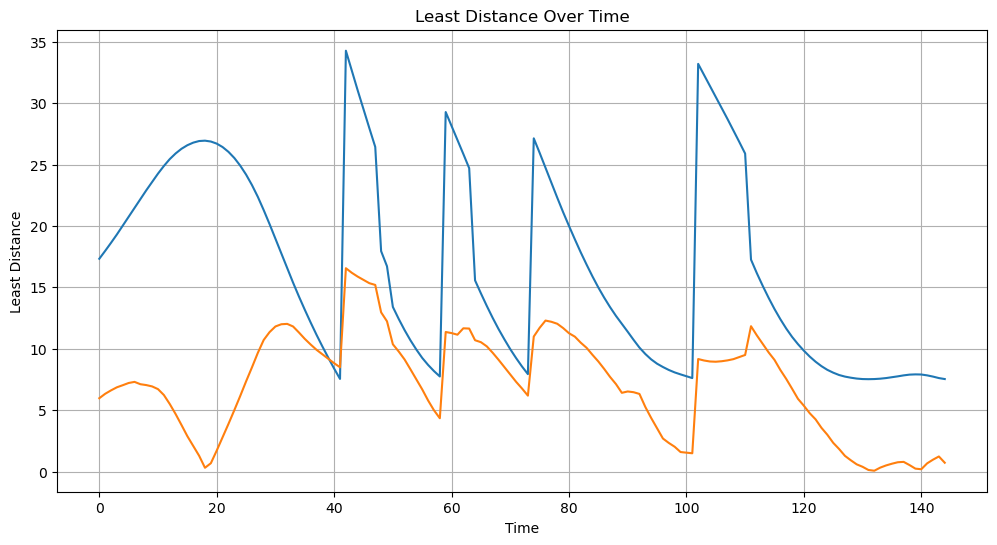

In [23]:
# Plotting
plt.figure(figsize=(12,6))
plt.plot(result_df['time'], result_df['least_distance'])
plt.title('Least Distance Over Time')
plt.xlabel('Time')
plt.ylabel('Least Distance')
plt.grid(True)

plt.plot(result_df['time'], result_df['relative_speed'])
plt.title('Least Distance Over Time')
plt.xlabel('Time')
plt.ylabel('Least Distance')
plt.grid(True)
plt.show()

In [21]:
from datetime import datetime, timedelta
# Base timestamp (you can set this to any date and time you want)
base_timestamp = datetime(2021, 1, 1)

# Convert time to timedelta (assuming time is in seconds) and then to datetime
result_df['time'] = result_df['time'].apply(lambda x: base_timestamp + timedelta(seconds=x))

In [22]:
result_df

,time,id,x,y,angle,type,speed,pos,lane,slope,acceleration,nearest_vehicle_id,least_distance,relative_speed,vehicle_id,position
0,2021-01-01 00:00:00,EGOVEHICLE,190.11,4.80,270.00,EGOVEHICLE,9.24,23.96,-E1_1,0,-0.08,f_4.2,17.33,5.98,NaN,NaN
1,2021-01-01 00:00:01,EGOVEHICLE,189.19,4.80,270.00,EGOVEHICLE,9.23,24.88,-E1_1,0,-0.07,f_4.2,17.97,6.34,NaN,NaN
2,2021-01-01 00:00:02,EGOVEHICLE,188.26,4.80,270.00,EGOVEHICLE,9.25,25.81,-E1_1,0,0.23,f_4.2,18.63,6.62,NaN,NaN
3,2021-01-01 00:00:03,EGOVEHICLE,187.33,4.80,270.00,EGOVEHICLE,9.31,26.74,-E1_1,0,0.53,f_4.2,19.31,6.87,NaN,NaN
4,2021-01-01 00:00:04,EGOVEHICLE,186.40,4.80,270.00,EGOVEHICLE,9.39,27.67,-E1_1,0,0.83,f_4.2,20.03,7.04,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140,2021-01-01 00:02:20,NaN,-59.38,-41.24,33.37,EGOVEHICLE,13.16,NaN,E5_0,0,3.06,f_1.2,7.91,0.20,EGOVEHICLE,71.41
141,2021-01-01 00:02:21,NaN,-58.64,-40.11,33.37,EGOVEHICLE,13.49,NaN,E5_0,0,3.36,f_1.2,7.84,0.68,EGOVEHICLE,72.76
142,2021-01-01 00:02:22,NaN,-57.90,-38.99,33.37,EGOVEHICLE,13.36,NaN,E5_0,0,-1.30,f_1.2,7.74,0.98,EGOVEHICLE,74.10
143,2021-01-01 00:02:23,NaN,-57.17,-37.88,33.37,EGOVEHICLE,13.31,NaN,E5_0,0,-0.50,f_1.2,7.62,1.24,EGOVEHICLE,75.43


In [23]:
train_dates = result_df['time']

In [24]:
result_df

,time,id,x,y,angle,type,speed,pos,lane,slope,acceleration,nearest_vehicle_id,least_distance,relative_speed,vehicle_id,position
0,2021-01-01 00:00:00,EGOVEHICLE,190.11,4.80,270.00,EGOVEHICLE,9.24,23.96,-E1_1,0,-0.08,f_4.2,17.33,5.98,NaN,NaN
1,2021-01-01 00:00:01,EGOVEHICLE,189.19,4.80,270.00,EGOVEHICLE,9.23,24.88,-E1_1,0,-0.07,f_4.2,17.97,6.34,NaN,NaN
2,2021-01-01 00:00:02,EGOVEHICLE,188.26,4.80,270.00,EGOVEHICLE,9.25,25.81,-E1_1,0,0.23,f_4.2,18.63,6.62,NaN,NaN
3,2021-01-01 00:00:03,EGOVEHICLE,187.33,4.80,270.00,EGOVEHICLE,9.31,26.74,-E1_1,0,0.53,f_4.2,19.31,6.87,NaN,NaN
4,2021-01-01 00:00:04,EGOVEHICLE,186.40,4.80,270.00,EGOVEHICLE,9.39,27.67,-E1_1,0,0.83,f_4.2,20.03,7.04,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140,2021-01-01 00:02:20,NaN,-59.38,-41.24,33.37,EGOVEHICLE,13.16,NaN,E5_0,0,3.06,f_1.2,7.91,0.20,EGOVEHICLE,71.41
141,2021-01-01 00:02:21,NaN,-58.64,-40.11,33.37,EGOVEHICLE,13.49,NaN,E5_0,0,3.36,f_1.2,7.84,0.68,EGOVEHICLE,72.76
142,2021-01-01 00:02:22,NaN,-57.90,-38.99,33.37,EGOVEHICLE,13.36,NaN,E5_0,0,-1.30,f_1.2,7.74,0.98,EGOVEHICLE,74.10
143,2021-01-01 00:02:23,NaN,-57.17,-37.88,33.37,EGOVEHICLE,13.31,NaN,E5_0,0,-0.50,f_1.2,7.62,1.24,EGOVEHICLE,75.43


In [25]:
result_df.set_index('time', inplace=True)

In [26]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense, Dropout
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.preprocessing import StandardScaler
import seaborn as sns

In [27]:
result_df = result_df[['relative_speed','least_distance']]

In [28]:
train = result_df.iloc[:-10]
test = result_df.iloc[-10:]

In [29]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# Assuming 'train' is your 1D array
# Reshape the data to a 2D array with one column
train_reshaped = train.values.reshape(-1, 2)

# Fit the scaler on the reshaped data
scaler.fit(train_reshaped)

# Transform the data using the fitted scaler
scaled_train = scaler.transform(train_reshaped)

In [30]:
from keras.preprocessing.sequence import TimeseriesGenerator

In [45]:
# We do the same thing, but now instead for 12 months
n_input = 10
n_features = 2
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

In [46]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM

In [47]:
from keras.models import Sequential
from keras.layers import LSTM, Dropout, Dense


model = Sequential()
model.add(LSTM(150, activation='relu', input_shape=(n_input, n_features), return_sequences=True))
model.add(LSTM(100, activation='relu', return_sequences=True))
model.add(LSTM(50, activation='relu', return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(50, activation='relu'))
model.add(Dense(2))

model.compile(optimizer='adam', loss='mse')
model.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 10, 150)           91800     
                                                                 
 lstm_4 (LSTM)               (None, 10, 100)           100400    
                                                                 
 lstm_5 (LSTM)               (None, 50)                30200     
                                                                 
 dropout_1 (Dropout)         (None, 50)                0         
                                                                 
 dense_2 (Dense)             (None, 50)                2550      
                                                                 
 dense_3 (Dense)             (None, 2)                 102       
                                                                 
Total params: 225052 (879.11 KB)
Trainable params: 225

In [48]:
# fit model
model.fit(generator,epochs=50)

Epoch 1/50
125/125 [==============================] - 4s 7ms/step - loss: 0.1033
Epoch 2/50
125/125 [==============================] - 1s 7ms/step - loss: 0.0758
Epoch 3/50
125/125 [==============================] - 1s 7ms/step - loss: 0.0800
Epoch 4/50
125/125 [==============================] - 1s 7ms/step - loss: 0.0717
Epoch 5/50
125/125 [==============================] - 1s 7ms/step - loss: 0.0658
Epoch 6/50
125/125 [==============================] - 1s 7ms/step - loss: 0.0653
Epoch 7/50
125/125 [==============================] - 1s 7ms/step - loss: 0.0636
Epoch 8/50
125/125 [==============================] - 1s 7ms/step - loss: 0.0561
Epoch 9/50
125/125 [==============================] - 1s 7ms/step - loss: 0.0694
Epoch 10/50
125/125 [==============================] - 1s 7ms/step - loss: 0.0746
Epoch 11/50
125/125 [==============================] - 1s 7ms/step - loss: 0.0653
Epoch 12/50
125/125 [==============================] - 1s 7ms/step - loss: 0.0592
Epoch 13/50
125/125 [====

In [49]:
last_train_batch = scaled_train[-10:]

In [50]:
last_train_batch = last_train_batch.reshape((1, n_input, n_features))

In [51]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    print(current_pred)
    print(current_batch)
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 [==============================] - 0s 290ms/step
[0.07483903 0.08650301]
[[[0.13774272 0.01982791]
  [0.10740291 0.01271979]
  [0.07342233 0.00785634]
  [0.05157767 0.00448934]
  [0.0315534  0.00187056]
  [0.01941748 0.00037411]
  [0.00364078 0.        ]
  [0.         0.00037411]
  [0.0151699  0.00149645]
  [0.02609223 0.003367  ]]]
1/1 [==============================] - 0s 16ms/step
[0.07899417 0.08692334]
[[[0.10740291 0.01271979]
  [0.07342233 0.00785634]
  [0.05157767 0.00448934]
  [0.0315534  0.00187056]
  [0.01941748 0.00037411]
  [0.00364078 0.        ]
  [0.         0.00037411]
  [0.0151699  0.00149645]
  [0.02609223 0.003367  ]
  [0.07483903 0.08650301]]]
1/1 [==============================] - 0s 16ms/step
[0.08373886 0.0880371 ]
[[[0.07342233 0.00785634]
  [0.05157767 0.00448934]
  [0.0315534  0.00187056]
  [0.01941748 0.00037411]
  [0.00364078 0.        ]
  [0.         0.00037411]
  [0.0151699  0.00149645]
  [0.02609223 0.003367  ]
  [0.07483903 0.08650301]
  [0.07899417

In [52]:
true_predictions = scaler.inverse_transform(test_predictions)

In [53]:
test = test.reset_index()

In [54]:
test

,index,time,relative_speed,least_distance
0,0,2021-01-01 00:02:15,0.65,7.69
1,1,2021-01-01 00:02:16,0.77,7.76
2,2,2021-01-01 00:02:17,0.80,7.84
3,3,2021-01-01 00:02:18,0.54,7.90
4,4,2021-01-01 00:02:19,0.25,7.92
5,5,2021-01-01 00:02:20,0.20,7.91
6,6,2021-01-01 00:02:21,0.68,7.84
7,7,2021-01-01 00:02:22,0.98,7.74
8,8,2021-01-01 00:02:23,1.24,7.62
9,9,2021-01-01 00:02:24,0.73,7.54


In [55]:
true_predictions = pd.DataFrame(true_predictions)

In [56]:
true_predictions

,0,1
0,1.313347,9.842226
1,1.381824,9.853461
2,1.460016,9.883232
3,1.519384,9.929795
4,1.569074,9.965549
5,1.604902,10.011922
6,1.624326,10.044547
7,1.626254,10.064924
8,1.617436,10.071692
9,1.607355,10.089402


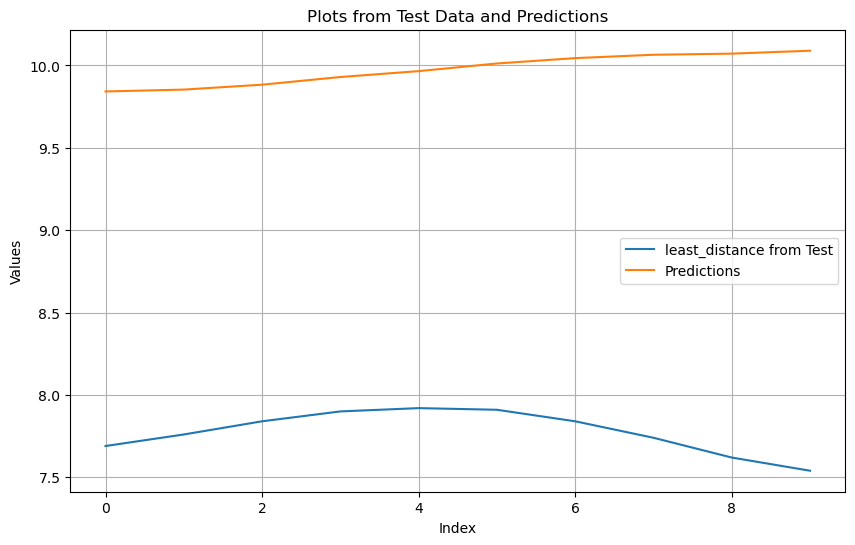

In [57]:
# Plotting
plt.figure(figsize=(10, 6))

# Plotting data from 'test'
plt.plot(test['least_distance'], label='least_distance from Test')
# plt.plot(test['Feature2'], label='Feature2 from Test')

# Plotting data from 'true_predictions'
plt.plot(true_predictions[1], label='Predictions')

plt.title('Plots from Test Data and Predictions')
plt.xlabel('Index')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [44]:
from sklearn.metrics import mean_squared_error
from math import sqrt
rmse=sqrt(mean_squared_error(test['least_distance'],true_predictions[0]))
print(rmse)
     

6.655804214517429
